Reading eigenvalues from ../Eigenvalues_folder/eigenres_H2_RNDbasis1.jld2
Reading eigenvalues from ../Eigenvalues_folder/eigenres_formaldehyde_RNDbasis1.jld2
Reading eigenvalues from ../Eigenvalues_folder/eigenres_uracil_RNDbasis1.jld2


┌ Warning: No strict ticks found
└ @ PlotUtils /home/fmereto/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /home/fmereto/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /home/fmereto/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /home/fmereto/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /home/fmereto/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /home/fmereto/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194
┌ Warning: No strict ticks found
└ @ PlotUtils /home/fmereto/.julia/packages/PlotUtils/dVEMd/src/ticks.jl:194


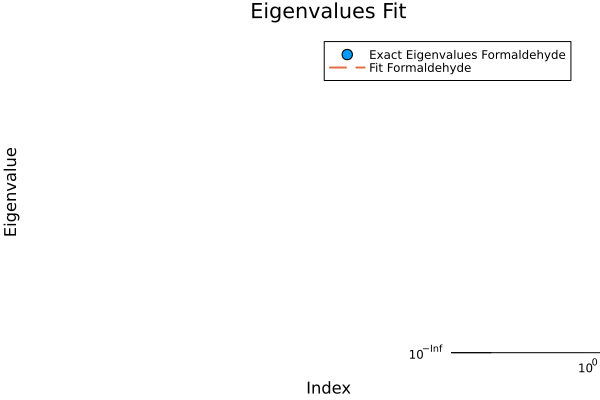

In [22]:
using LsqFit
using Plots
using JLD2

function read_eigenresults(molecule::String)
    output_file = "../Eigenvalues_folder/eigenres_" * molecule * "_RNDbasis1.jld2"
    println("Reading eigenvalues from $output_file")
    data = jldopen(output_file, "r")
    eigenvalues = data["eigenvalues"]
    close(data)
    return sort(eigenvalues)
end

# Define your fitting model
model(x, p) = p[1].^2 .* exp.(- 2 .* p[2] .* x .^ p[3])

Σexact_H2 = read_eigenresults("H2")
Σexact_formal = read_eigenresults("formaldehyde")
Σexact_uracile = read_eigenresults("uracil")

# Prepare data for fitting
ydata_H2 = abs.(Σexact_H2[1:end-200])
ydata_formal = abs.(Σexact_formal[1:end-500]) 
ydata_uracile = abs.(Σexact_uracile[1:end-600])
xdata_H2 = collect(1:length(ydata_H2))
xdata_formal = collect(1:length(ydata_formal))
xdata_uracile = collect(1:length(ydata_uracile))

# determine the y value corresponding to N_final
y_final_formal = Σexact_formal[N_final_formal]
y_final_uracile = Σexact_uracile[N_final_uracile]
y_final_H2 = Σexact_H2[N_final_H2]  

# Initial guess for parameters
a = 51.0282
b = 0.755229
c = 0.336993
p0 = [a,b,c]

# Perform the fit
fit_formal = curve_fit(model, xdata_formal, ydata_formal, p0)

function new_curve(x, p)
    return p[1] .* exp.(- p[2] .* x .^ p[3]) 
end

yfit_formal = abs.(model(xdata_formal, fit_formal.param))
yfit_formal[yfit_formal .< 1e-12] .= 1e-8


# Plotting
scatter(xdata_formal, abs.(ydata_formal), label="Exact Eigenvalues Formaldehyde", xlabel="Index", ylabel="Eigenvalue", title="Eigenvalues Fit", marker=:circle)
plot!(xdata_formal, model(xdata_formal, fit_formal.param), label="Fit Formaldehyde", lw=2, linestyle=:dash)
# plot!(xdata_formal, new_curve(xdata_formal, p0).^2, label="Manual Fit Formaldehyde", lw=2, linestyle=:dot)
# plot!(xscale=:log10, yscale=:log10, legend=:bottomleft)
# display(current())
# # scatter!(xdata_uracile, abs.(ydata_uracile), label="Exact Eigenvalues Uracile", marker=:diamond)
# # scatter!(xdata_H2, abs.(ydata_H2), label="Exact Eigenvalues H2", marker=:star)
plot!(xscale=:log10, yscale=:log10, legend=:topright)


Reading eigenvalues from ../Eigenvalues_folder/eigenres_H2_RNDbasis1.jld2
Reading eigenvalues from ../Eigenvalues_folder/eigenres_formaldehyde_RNDbasis1.jld2
Reading eigenvalues from ../Eigenvalues_folder/eigenres_uracil_RNDbasis1.jld2
Fit parameters: [10.596831673142946, 0.48400035837637, 0.6256989967001326]
Fit converged: true


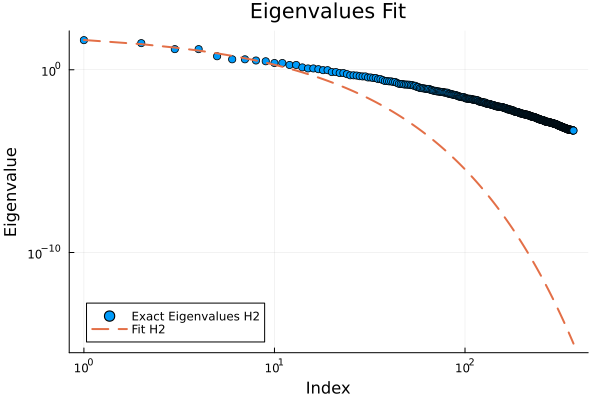

In [32]:
using LsqFit
using Plots
using JLD2

function read_eigenresults(molecule::String)
    output_file = "../Eigenvalues_folder/eigenres_" * molecule * "_RNDbasis1.jld2"
    println("Reading eigenvalues from $output_file")
    data = jldopen(output_file, "r")
    eigenvalues = data["eigenvalues"]
    close(data)
    return sort(eigenvalues)
end

# Define your fitting model
model(x, p) = p[1].^2 .* exp.(- 2 .* p[2] .* x .^ p[3])

Σexact_H2 = read_eigenresults("H2")
Σexact_formal = read_eigenresults("formaldehyde")
Σexact_uracile = read_eigenresults("uracil")

# Prepare data for fitting
ydata_H2 = abs.(Σexact_H2[1:end-200])
ydata_formal = abs.(Σexact_formal[1:end-500])
ydata_uracile = abs.(Σexact_uracile[1:end-600])

xdata_H2 = collect(1:length(ydata_H2))
xdata_formal = collect(1:length(ydata_formal))
xdata_uracile = collect(1:length(ydata_uracile))

# Initial guess for parameters
a = 51.0282
b = 0.755229
c = 0.336993
p0 = [a,b,c]

# Perform the fit
fit_H2 = curve_fit(model, xdata_H2, ydata_H2, p0)

println("Fit parameters: ", fit_H2.param)
println("Fit converged: ", fit_H2.converged)

# Generate fitted values
yfit_H2 = model(xdata_H2, fit_H2.param)

# Filter out zeros and very small values for log plotting
valid_idx = (abs.(ydata_H2) .> 1e-15) .& (yfit_H2 .> 1e-15)

# Plotting
scatter(xdata_H2[valid_idx], abs.(ydata_H2[valid_idx]), 
        label="Exact Eigenvalues H2", 
        xlabel="Index", ylabel="Eigenvalue", 
        title="Eigenvalues Fit", marker=:circle,
        xscale=:log10, yscale=:log10, legend=:bottomleft)
plot!(xdata_H2[valid_idx], yfit_H2[valid_idx], 
      label="Fit H2", lw=2, linestyle=:dash)
# plot!(xdata_formal[valid_idx], model(xdata_formal[valid_idx], p0), 
      # label="Manual Fit Formaldehyde", lw=2, linestyle=:dot)

In [2]:
# Final N values for each molecule
N_final_formal = 1200
N_final_uracile = 4200
N_final_H2 = 2000

# draw a vertical line at N_final
# vline!([N_final_formal], label="N_final Formaldehyde", linestyle=:dash, color=:black)
# vline!([N_final_uracile], label="N_final Uracile", linestyle=:dash, color=:gray)
# vline!([N_final_H2], label="N_final H2", linestyle=:dash, color=:orange)

# hline!([abs(y_final_formal)], label="Eigenvalue at N_final Formaldehyde", linestyle=:dot, color=:black)
# hline!([abs(y_final_uracile)], label="Eigenvalue at N_final Uracile", linestyle=:dot, color=:gray)
# hline!([abs(y_final_H2)], label="Eigenvalue at N_final H2", linestyle=:dot, color=:orange)

2000

Reading eigenvalues from test_EW_results.jld2
Exact eigenvalue number 400: -0.0741224844456161


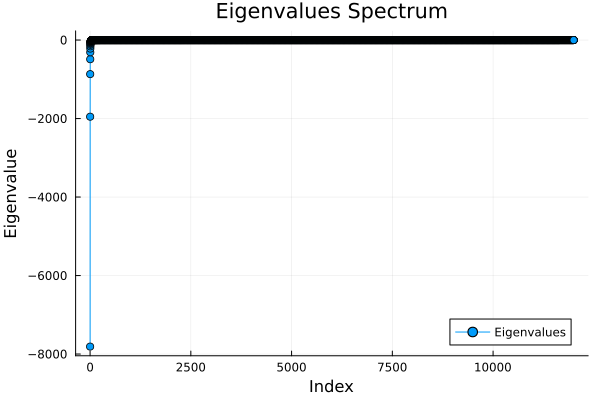

In [3]:
using LinearAlgebra
using JLD2

function read_eigenresults(name::String)
    println("Reading eigenvalues from $name")
    data = jldopen(name, "r")
    eigenvalues = data["eigenvalues"]
    close(data)
    return sort(eigenvalues)
end

EV = read_eigenresults("test_EW_results.jld2")
N = length(EV)
number = 400
println("Exact eigenvalue number $number: ", EV[number])

using Plots

plot(1:N, EV, xlabel="Index", ylabel="Eigenvalue", title="Eigenvalues Spectrum", marker=:circle, label="Eigenvalues")

Reading eigenvalues from test_EW_results.jld2
Exact eigenvalue number 400: -0.0741224844456161


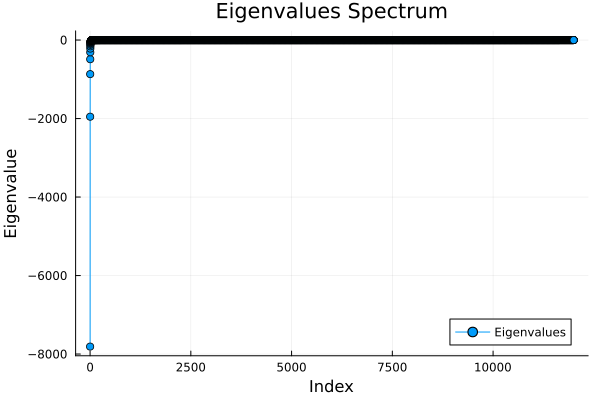

In [4]:
using LinearAlgebra
using JLD2

function read_eigenresults(name::String)
    println("Reading eigenvalues from $name")
    data = jldopen(name, "r")
    eigenvalues = data["eigenvalues"]
    close(data)
    return sort(eigenvalues)
end

EV = read_eigenresults("test_EW_results.jld2")
N = length(EV)
number = 400
println("Exact eigenvalue number $number: ", EV[number])

using Plots

plot(1:N, EV, xlabel="Index", ylabel="Eigenvalue", title="Eigenvalues Spectrum", marker=:circle, label="Eigenvalues")

In [5]:
# umformen von jld2 into dat
using JLD2
using DelimitedFiles

function jld2_to_dat(jld2_file::String, dat_file::String; key=nothing)
    # Load the JLD2 file
    data = load(jld2_file)
    
    # If no specific key provided, use the first one
    if key === nothing
        key = first(keys(data))
    end
    
    # Extract the data
    dataset = data[key]
    
    # Check if it's a matrix/array that can be written as table
    if ndims(dataset) == 1
        # 1D array - write as single column
        writedlm(dat_file, dataset)
    elseif ndims(dataset) == 2
        # 2D array - write as table
        writedlm(dat_file, dataset)
    else
        error("Data has $(ndims(dataset)) dimensions. Can only convert 1D or 2D arrays.")
    end
    
    println("Converted $jld2_file to $dat_file")
    println("Key used: $key")
    println("Data shape: $(size(dataset))")
end

jld2_to_dat (generic function with 1 method)

In [6]:
# function read_eigenresults(number::Integer)
#     output_file = "test_EW_results_$number.jld2"
#     println("Reading eigenvalues from $output_file")
#     data = jldopen(output_file, "r")
#     eigenvalues = data["eigenvalues"]
#     close(data)
#     return sort(eigenvalues)
# end

# ev = read_eigenresults(1)
# xdata = collect(1:length(ev))
# ydata = ev

# plot(xdata, -ydata, xlabel="Index", ylabel="Eigenvalue", title="Eigenvalues Spectrum", marker=:circle, label="Eigenvalues")
# # plot!(xdata, new_curve(xdata, a, b, c).^2, label="New Fit", lw=2, linestyle=:dash)

# plot!(xscale=:log10, legend=:topright)


In [7]:
using JLD2

function load_eigenresults(output_file)
    # Unpack directly into variables
    data = load(output_file)  # Returns a Dict-like object
    Σexact = data["Σexact"]  # Access by key
    Uexact = data["Uexact"]
    return Σexact, Uexact
end

# Usage
Σexact, Uexact = load_eigenresults("eigen_results_hBN.jld2")
println("Loaded Σexact (first 5 eigenvalues): ", Σexact[1:5])

ArgumentError: ArgumentError: No file exists at given path: eigen_results_hBN.jld2

Test time Transformation

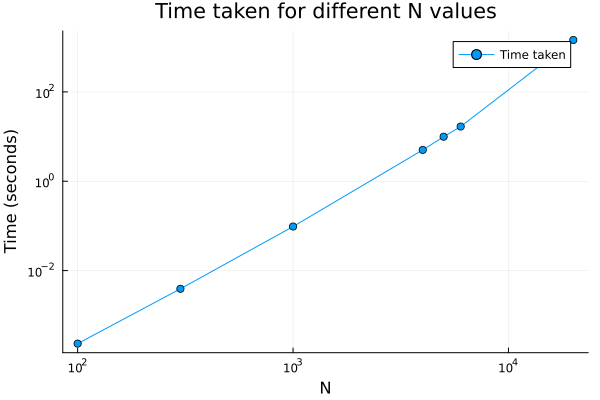

In [8]:
Ns = [100, 300, 1000, 4000, 5000, 6000, 20000]

times = [0.000232, 0.003914, 0.096913, 5.025422, 9.929093, 16.774097, 1453.430445]

using Plots
plot(Ns, times, marker=:circle, label="Time taken", xlabel="N", ylabel="Time (seconds)", title="Time taken for different N values")
xaxis!(:log10)
yaxis!(:log10)

In [9]:
using LinearAlgebra

function define_matrix(N)
    # Define a simple matrix for demonstration
    return rand(N, N)  # Replace with actual matrix definition as needed
end

A = define_matrix(4)
D = diag(A)
display(D)

diagonal_matrix = Diagonal(D) |> Matrix
Hermitian_matrix = Hermitian(diagonal_matrix)
display(Hermitian_matrix)

4-element Vector{Float64}:
 0.06296417168621049
 0.00012416107142643185
 0.10934095271537925
 0.3018055688339185

4×4 Hermitian{Float64, Matrix{Float64}}:
 0.0629642  0.0          0.0       0.0
 0.0        0.000124161  0.0       0.0
 0.0        0.0          0.109341  0.0
 0.0        0.0          0.0       0.301806